## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---


## 1. Compute the camera calibration using chessboard images

In [207]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
from moviepy.editor import VideoFileClip
from IPython.display import HTML
# %matplotlib qt
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        #img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #plt.imshow(img)

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)



## 2. Apply a distortion correction to raw images.

In [7]:
def side_by_side(img1, img2):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title('Before', fontsize=50)
    if len(img2.shape) == 2:
        ax2.imshow(img2, cmap='gray')
    else:
        ax2.imshow(img2)
    ax2.set_title('After', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

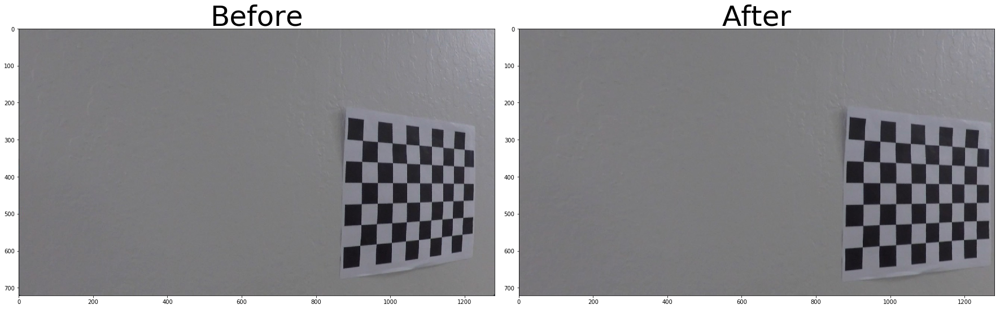

In [3]:
# to chessboard images
for fname in images[:1]:
    img = plt.imread(fname)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    #plt.imshow(undist)
    side_by_side(img, undist)

    plt.imsave("./output_images/calibrated/%s" % os.path.basename(fname), undist)

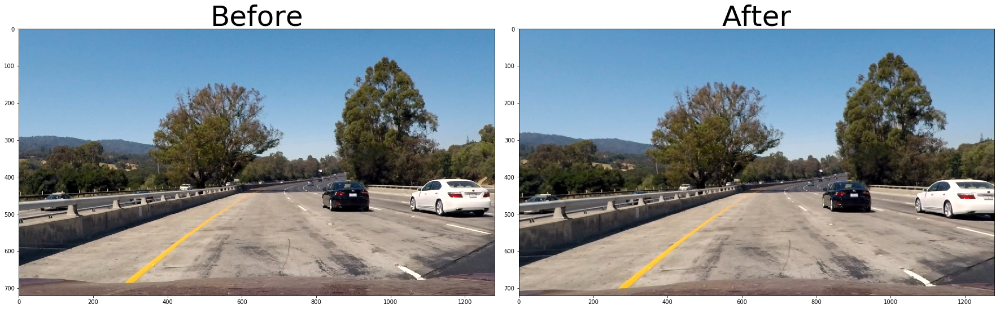

In [222]:
# to road images
for fname in glob.glob('./test_images/test*.jpg')[0:1]:
    img = plt.imread(fname)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # plt.imshow(undist)
    side_by_side(img, undist)
    

## 3. Use color transforms, gradients, etc., to create a thresholded binary image.

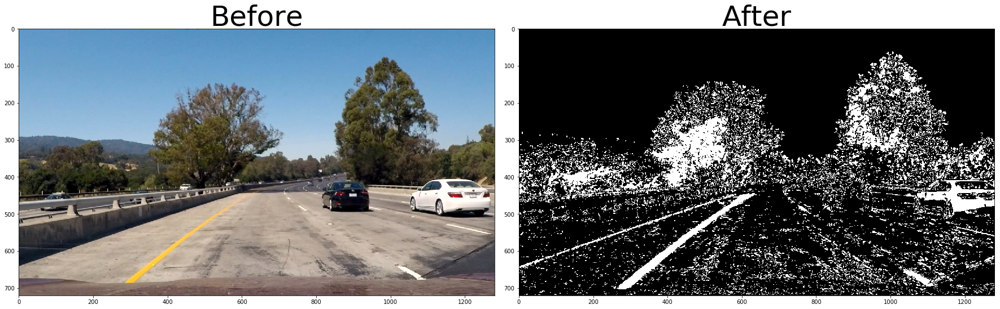

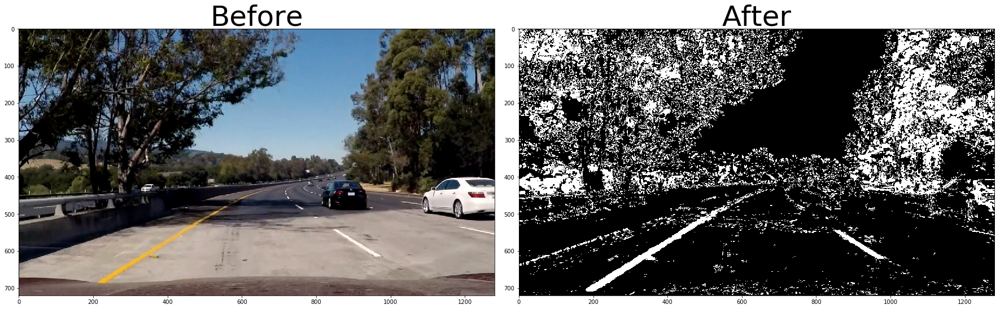

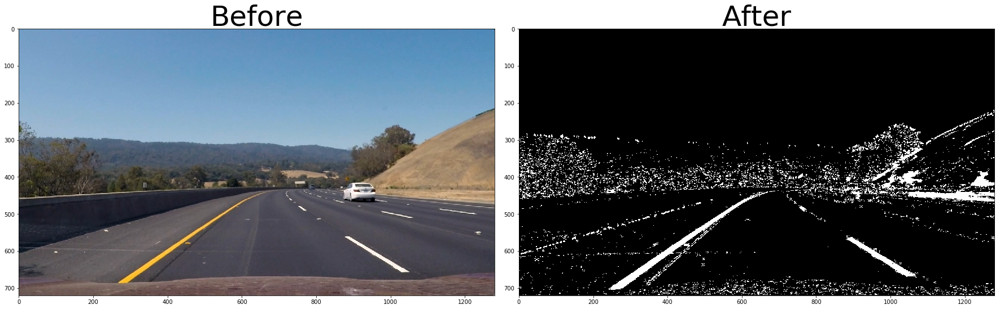

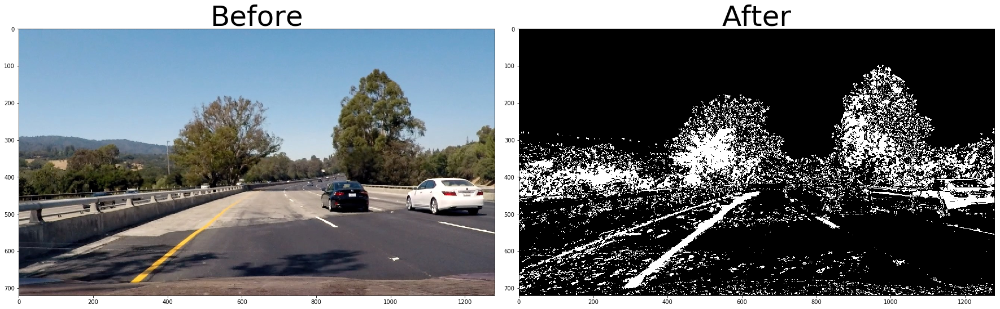

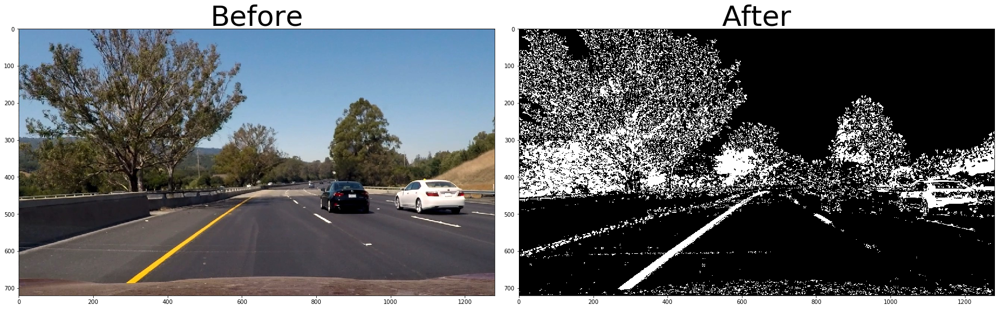

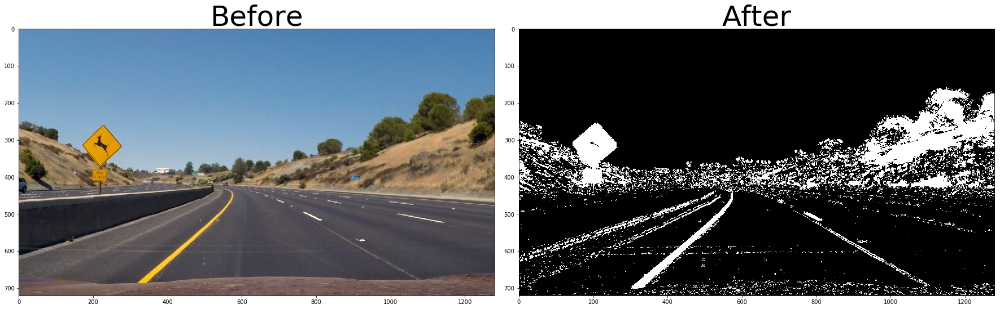

In [169]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    soby = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    dirs = np.arctan2(soby, sobx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(dirs)
    binary_output[(dirs >= thresh[0]) & (dirs <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    
    #binary_output = cv2.medianBlur(binary_output.astype(np.uint8), ksize=5)
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobx= cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    soby= cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    grad = np.sqrt(sobx ** 2 + soby ** 2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    grad = np.uint8(255 * grad / np.max(grad))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(grad)
    binary_output[(grad >= mag_thresh[0]) & (grad <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def hls_thresh(img, h_thresh=(5, 60), s_thresh=(80, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    
    binary_output = np.zeros_like(H)
    binary_output[
        (S > s_thresh[0]) & (S <= s_thresh[1])
        & (H > h_thresh[0]) & (H <= h_thresh[1])
    ] = 1
    return binary_output
    
    
def get_binary(image):
    mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(10, 255))
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
    hls_binary = hls_thresh(image)
    return (dir_binary > 0) & (mag_binary > 0) | (hls_binary > 0)# &  & 

# # to road images
# for fname in glob.glob('./test_images/test*.jpg')[:]:
#     img = plt.imread(fname)
#     undist = cv2.undistort(img, mtx, dist, None, mtx)
#     binary = get_binary(undist)
    
#     # plt.imshow(undist)
#     side_by_side(img, binary)

## 4. Apply a perspective transform to rectify binary image ("birds-eye view").

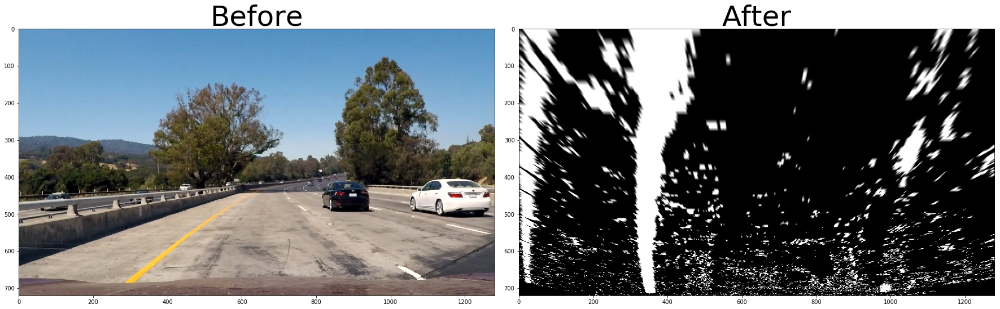

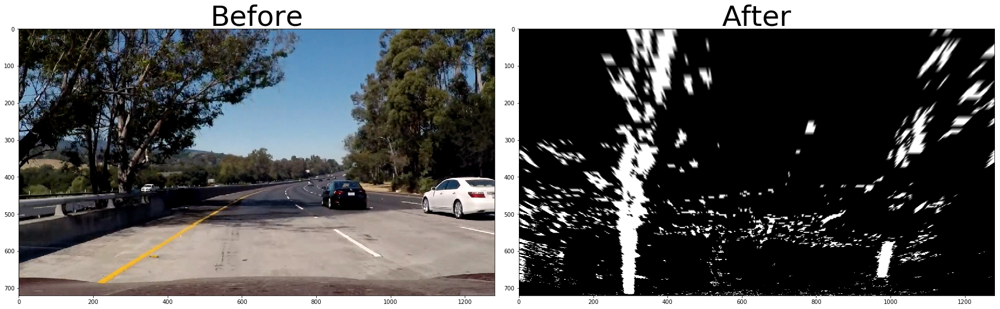

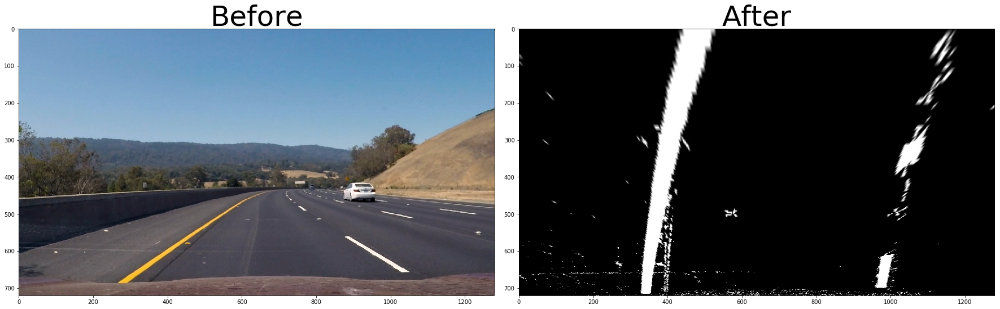

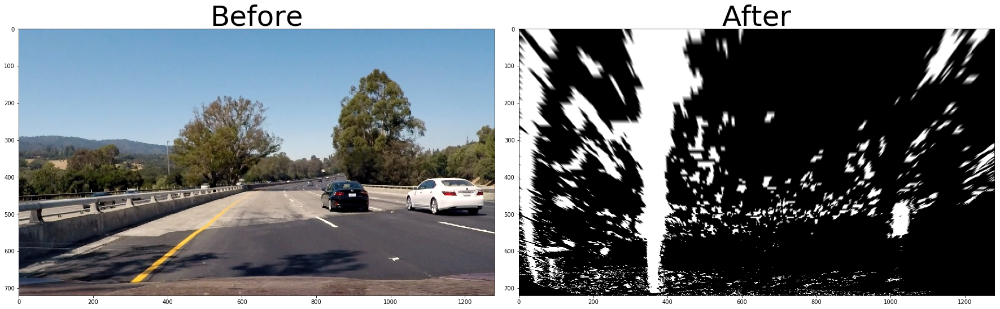

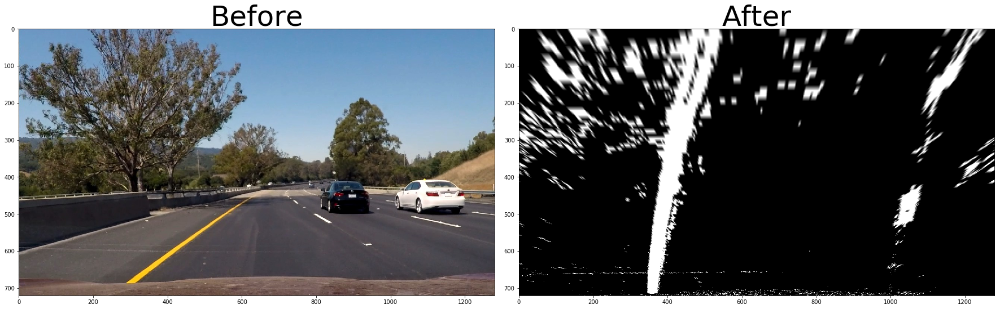

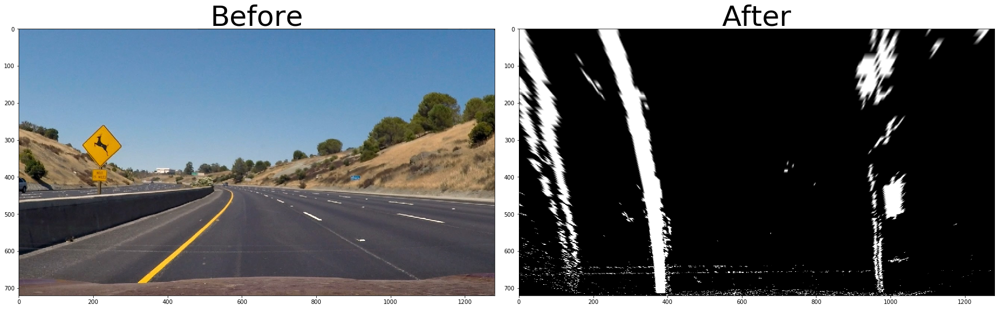

In [173]:
def warp_perspective(img, reverse=False):
    img_size = (img.shape[1], img.shape[0])
    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    if reverse:
        M = cv2.getPerspectiveTransform(dst, src)
    else:
        M = cv2.getPerspectiveTransform(src, dst)
    return cv2.warpPerspective(img, M, img_size)


# # to road images
# for fname in glob.glob('./test_images/test*.jpg')[:]:
#     img = plt.imread(fname)
#     undist = cv2.undistort(img, mtx, dist, None, mtx)
#     binary = (get_binary(undist) * 255).astype(np.uint8)
# #     color_binary = 255 * np.dstack((binary, binary, binary)).astype(np.uint8)
#     warped = warp_perspective(binary)
    
    # plt.imshow(undist)
    side_by_side(img, warped)

## 5. Detect lane pixels and fit to find the lane boundary. 
## 6. Determine the curvature of the lane and vehicle position with respect to center.
## 7. Warp the detected lane boundaries back onto the original image.
## 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

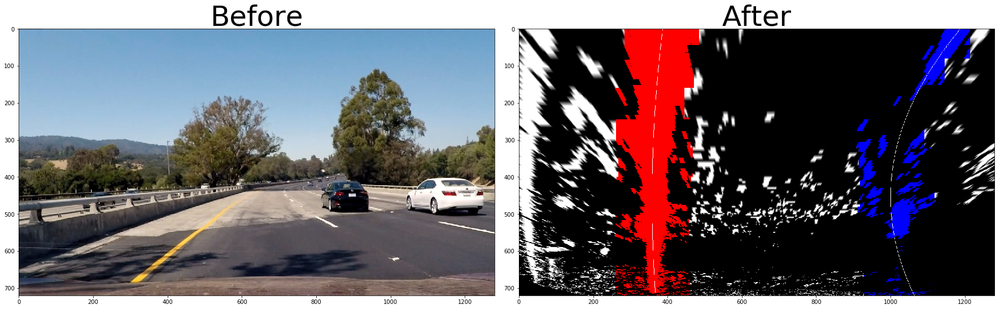

In [227]:

def find_lane_pixels_window_search(binary_warped, draw_debug=False):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    #out_img = binary_warped
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        if draw_debug:
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),
            (win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),
            (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)
                        & (nonzeroy >= win_y_low) & (nonzeroy < win_y_high)).nonzero()[0]
        #print(good_left_inds)
        good_right_inds = ((nonzerox >= win_xright_low) & (nonzerox < win_xright_high)
                         & (nonzeroy >= win_y_low) & (nonzeroy < win_y_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.mean(nonzerox[good_left_inds]).astype(np.int)
        if len(good_right_inds) > minpix:
            rightx_current = np.mean(nonzerox[good_right_inds]).astype(np.int)

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels_window_search(binary_warped)

    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    # draw fitted lines
    out_img[ploty.astype(int), left_fitx.astype(int)] = [255,255,255]
    out_img[ploty.astype(int), right_fitx.astype(int)] = [255,255,255]
    
    return out_img, (left_fitx, right_fitx, ploty)

def visulize_lane(img, fit_bundle):
    overlay = np.zeros_like(img)
    left_fitx, right_fitx, ploty = fit_bundle
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(overlay, np.int_([pts]), (0, 255, 0))
    overlay = warp_perspective(overlay, reverse=True)
    return cv2.addWeighted(img, 1, overlay, 0.3, 0)

def measure_curvature_offset_real(fit_bundle):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30.0/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    left_fitx, right_fitx, ploty = fit_bundle
    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    curvature = (left_curverad + right_curverad) / 2.0
    
    
    left_fitx, right_fitx, ploty = fit_bundle
    offset = ((right_fitx[-1] + left_fitx[-1]) / 2 - 640) * xm_per_pix
    
    return curvature, offset

def show_info(img, curvature, offset):
    cv2.putText(img, "Radius of curvature: %.3f m" %(curvature), 
        (30,30), cv2.FONT_HERSHEY_SIMPLEX, 1, [255,255,255], 2)
    cv2.putText(img, "offset: %.8f m" % (offset), 
        (30,60), cv2.FONT_HERSHEY_SIMPLEX, 1, [255,255,255], 2) 

def pipeline(img):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    binary = (get_binary(undist) * 255).astype(np.uint8)

    # fit lane
    warped_binary = warp_perspective(binary)
    warped, fit_bundle = fit_polynomial(warped_binary)

    side_by_side(img, warped)
    # draw lane on original image
    undist = visulize_lane(undist, fit_bundle)

    curvature, offset = measure_curvature_offset_real(fit_bundle)
    show_info(undist, curvature, offset)
    
    return undist
    
# to road images
for fname in glob.glob('./test_images/test*.jpg')[3:4]:
    img = plt.imread(fname)
    processed = pipeline(img)
    
    # plt.imshow(undist)
    #side_by_side(img, processed)
    
    

## Final: run on video

In [216]:
f1 = 'submission.mp4'
clip1 = VideoFileClip("project_video.mp4")#.subclip(0,5)
w1 = clip1.fl_image(pipeline)
%time w1.write_videofile(f1, audio=False)


[MoviePy] >>>> Building video submission.mp4
[MoviePy] Writing video submission.mp4




  0%|          | 0/1261 [00:00<?, ?it/s]

  0%|          | 1/1261 [00:00<06:28,  3.24it/s]

  0%|          | 2/1261 [00:00<06:34,  3.19it/s]

  0%|          | 3/1261 [00:00<06:33,  3.20it/s]

  0%|          | 4/1261 [00:01<06:28,  3.24it/s]

  0%|          | 5/1261 [00:01<06:23,  3.28it/s]

  0%|          | 6/1261 [00:01<06:20,  3.29it/s]

  1%|          | 7/1261 [00:02<06:19,  3.31it/s]

  1%|          | 8/1261 [00:02<06:15,  3.34it/s]

  1%|          | 9/1261 [00:02<06:15,  3.34it/s]

  1%|          | 10/1261 [00:03<06:13,  3.35it/s]

  1%|          | 11/1261 [00:03<06:09,  3.38it/s]

  1%|          | 12/1261 [00:03<06:09,  3.38it/s]

  1%|          | 13/1261 [00:03<06:05,  3.41it/s]

  1%|          | 14/1261 [00:04<06:05,  3.41it/s]

  1%|          | 15/1261 [00:04<06:06,  3.40it/s]

  1%|▏         | 16/1261 [00:04<06:06,  3.40it/s]

  1%|▏         | 17/1261 [00:05<06:05,  3.40it/s]

  1%|▏         | 18/1261 [00:05<06:05,  3.40it/s]

  2%|▏         | 19/1261 [00:05<06:04,  3.41it/

 11%|█▏        | 143/1261 [00:51<06:53,  2.71it/s]

 11%|█▏        | 144/1261 [00:51<06:51,  2.72it/s]

 11%|█▏        | 145/1261 [00:51<06:53,  2.70it/s]

 12%|█▏        | 146/1261 [00:52<06:52,  2.71it/s]

 12%|█▏        | 147/1261 [00:52<06:51,  2.71it/s]

 12%|█▏        | 148/1261 [00:53<06:49,  2.72it/s]

 12%|█▏        | 149/1261 [00:53<06:54,  2.69it/s]

 12%|█▏        | 150/1261 [00:53<06:57,  2.66it/s]

 12%|█▏        | 151/1261 [00:54<06:54,  2.68it/s]

 12%|█▏        | 152/1261 [00:54<06:53,  2.68it/s]

 12%|█▏        | 153/1261 [00:54<06:50,  2.70it/s]

 12%|█▏        | 154/1261 [00:55<06:53,  2.68it/s]

 12%|█▏        | 155/1261 [00:55<06:57,  2.65it/s]

 12%|█▏        | 156/1261 [00:56<06:56,  2.65it/s]

 12%|█▏        | 157/1261 [00:56<06:54,  2.66it/s]

 13%|█▎        | 158/1261 [00:56<06:54,  2.66it/s]

 13%|█▎        | 159/1261 [00:57<06:54,  2.66it/s]

 13%|█▎        | 160/1261 [00:57<06:51,  2.68it/s]

 13%|█▎        | 161/1261 [00:57<06:50,  2.68it/s]

 13%|█▎     

 23%|██▎       | 284/1261 [01:44<06:12,  2.62it/s]

 23%|██▎       | 285/1261 [01:44<06:12,  2.62it/s]

 23%|██▎       | 286/1261 [01:44<06:13,  2.61it/s]

 23%|██▎       | 287/1261 [01:45<06:04,  2.67it/s]

 23%|██▎       | 288/1261 [01:45<06:12,  2.61it/s]

 23%|██▎       | 289/1261 [01:45<06:05,  2.66it/s]

 23%|██▎       | 290/1261 [01:46<06:10,  2.62it/s]

 23%|██▎       | 291/1261 [01:46<06:01,  2.68it/s]

 23%|██▎       | 292/1261 [01:47<06:01,  2.68it/s]

 23%|██▎       | 293/1261 [01:47<05:54,  2.73it/s]

 23%|██▎       | 294/1261 [01:47<05:51,  2.75it/s]

 23%|██▎       | 295/1261 [01:48<05:45,  2.80it/s]

 23%|██▎       | 296/1261 [01:48<05:53,  2.73it/s]

 24%|██▎       | 297/1261 [01:48<05:50,  2.75it/s]

 24%|██▎       | 298/1261 [01:49<06:01,  2.66it/s]

 24%|██▎       | 299/1261 [01:49<05:55,  2.70it/s]

 24%|██▍       | 300/1261 [01:50<06:07,  2.61it/s]

 24%|██▍       | 301/1261 [01:50<05:58,  2.68it/s]

 24%|██▍       | 302/1261 [01:50<06:02,  2.65it/s]

 24%|██▍    

 34%|███▎      | 425/1261 [02:36<05:16,  2.64it/s]

 34%|███▍      | 426/1261 [02:37<05:08,  2.71it/s]

 34%|███▍      | 427/1261 [02:37<05:13,  2.66it/s]

 34%|███▍      | 428/1261 [02:37<05:07,  2.71it/s]

 34%|███▍      | 429/1261 [02:38<05:14,  2.64it/s]

 34%|███▍      | 430/1261 [02:38<05:07,  2.70it/s]

 34%|███▍      | 431/1261 [02:38<05:14,  2.64it/s]

 34%|███▍      | 432/1261 [02:39<05:08,  2.69it/s]

 34%|███▍      | 433/1261 [02:39<05:17,  2.61it/s]

 34%|███▍      | 434/1261 [02:40<05:11,  2.66it/s]

 34%|███▍      | 435/1261 [02:40<05:16,  2.61it/s]

 35%|███▍      | 436/1261 [02:40<05:08,  2.67it/s]

 35%|███▍      | 437/1261 [02:41<05:12,  2.63it/s]

 35%|███▍      | 438/1261 [02:41<05:05,  2.70it/s]

 35%|███▍      | 439/1261 [02:41<05:10,  2.65it/s]

 35%|███▍      | 440/1261 [02:42<05:05,  2.69it/s]

 35%|███▍      | 441/1261 [02:42<05:10,  2.65it/s]

 35%|███▌      | 442/1261 [02:43<05:03,  2.70it/s]

 35%|███▌      | 443/1261 [02:43<05:09,  2.65it/s]

 35%|███▌   

 45%|████▍     | 566/1261 [03:30<04:35,  2.52it/s]

 45%|████▍     | 567/1261 [03:30<04:41,  2.47it/s]

 45%|████▌     | 568/1261 [03:31<04:35,  2.52it/s]

 45%|████▌     | 569/1261 [03:31<04:40,  2.47it/s]

 45%|████▌     | 570/1261 [03:31<04:34,  2.51it/s]

 45%|████▌     | 571/1261 [03:32<04:40,  2.46it/s]

 45%|████▌     | 572/1261 [03:32<04:34,  2.51it/s]

 45%|████▌     | 573/1261 [03:33<04:40,  2.45it/s]

 46%|████▌     | 574/1261 [03:33<04:33,  2.51it/s]

 46%|████▌     | 575/1261 [03:33<04:38,  2.46it/s]

 46%|████▌     | 576/1261 [03:34<04:31,  2.52it/s]

 46%|████▌     | 577/1261 [03:34<04:36,  2.48it/s]

 46%|████▌     | 578/1261 [03:35<04:31,  2.51it/s]

 46%|████▌     | 579/1261 [03:35<04:36,  2.46it/s]

 46%|████▌     | 580/1261 [03:35<04:30,  2.52it/s]

 46%|████▌     | 581/1261 [03:36<04:35,  2.47it/s]

 46%|████▌     | 582/1261 [03:36<04:29,  2.52it/s]

 46%|████▌     | 583/1261 [03:37<04:37,  2.44it/s]

 46%|████▋     | 584/1261 [03:37<04:44,  2.38it/s]

 46%|████▋  

 56%|█████▌    | 707/1261 [04:25<03:22,  2.73it/s]

 56%|█████▌    | 708/1261 [04:26<03:26,  2.68it/s]

 56%|█████▌    | 709/1261 [04:26<03:20,  2.75it/s]

 56%|█████▋    | 710/1261 [04:26<03:25,  2.68it/s]

 56%|█████▋    | 711/1261 [04:27<03:19,  2.75it/s]

 56%|█████▋    | 712/1261 [04:27<03:22,  2.71it/s]

 57%|█████▋    | 713/1261 [04:27<03:18,  2.75it/s]

 57%|█████▋    | 714/1261 [04:28<03:22,  2.70it/s]

 57%|█████▋    | 715/1261 [04:28<03:17,  2.77it/s]

 57%|█████▋    | 716/1261 [04:29<03:22,  2.69it/s]

 57%|█████▋    | 717/1261 [04:29<03:15,  2.78it/s]

 57%|█████▋    | 718/1261 [04:29<03:19,  2.72it/s]

 57%|█████▋    | 719/1261 [04:30<03:14,  2.78it/s]

 57%|█████▋    | 720/1261 [04:30<03:19,  2.71it/s]

 57%|█████▋    | 721/1261 [04:30<03:15,  2.77it/s]

 57%|█████▋    | 722/1261 [04:31<03:19,  2.70it/s]

 57%|█████▋    | 723/1261 [04:31<03:15,  2.76it/s]

 57%|█████▋    | 724/1261 [04:31<03:18,  2.71it/s]

 57%|█████▋    | 725/1261 [04:32<03:13,  2.77it/s]

 58%|█████▊ 

 67%|██████▋   | 848/1261 [05:17<02:33,  2.69it/s]

 67%|██████▋   | 849/1261 [05:18<02:30,  2.75it/s]

 67%|██████▋   | 850/1261 [05:18<02:32,  2.69it/s]

 67%|██████▋   | 851/1261 [05:18<02:29,  2.74it/s]

 68%|██████▊   | 852/1261 [05:19<02:34,  2.64it/s]

 68%|██████▊   | 853/1261 [05:19<02:30,  2.71it/s]

 68%|██████▊   | 854/1261 [05:20<02:34,  2.64it/s]

 68%|██████▊   | 855/1261 [05:20<02:30,  2.69it/s]

 68%|██████▊   | 856/1261 [05:20<02:33,  2.65it/s]

 68%|██████▊   | 857/1261 [05:21<02:29,  2.71it/s]

 68%|██████▊   | 858/1261 [05:21<02:30,  2.67it/s]

 68%|██████▊   | 859/1261 [05:21<02:26,  2.74it/s]

 68%|██████▊   | 860/1261 [05:22<02:30,  2.66it/s]

 68%|██████▊   | 861/1261 [05:22<02:26,  2.73it/s]

 68%|██████▊   | 862/1261 [05:22<02:28,  2.69it/s]

 68%|██████▊   | 863/1261 [05:23<02:24,  2.75it/s]

 69%|██████▊   | 864/1261 [05:23<02:26,  2.71it/s]

 69%|██████▊   | 865/1261 [05:24<02:23,  2.76it/s]

 69%|██████▊   | 866/1261 [05:24<02:26,  2.69it/s]

 69%|██████▉

 78%|███████▊  | 989/1261 [06:10<01:50,  2.46it/s]

 79%|███████▊  | 990/1261 [06:11<01:48,  2.49it/s]

 79%|███████▊  | 991/1261 [06:11<01:50,  2.45it/s]

 79%|███████▊  | 992/1261 [06:12<01:47,  2.50it/s]

 79%|███████▊  | 993/1261 [06:12<01:48,  2.46it/s]

 79%|███████▉  | 994/1261 [06:12<01:46,  2.52it/s]

 79%|███████▉  | 995/1261 [06:13<01:46,  2.50it/s]

 79%|███████▉  | 996/1261 [06:13<01:47,  2.46it/s]

 79%|███████▉  | 997/1261 [06:14<01:44,  2.52it/s]

 79%|███████▉  | 998/1261 [06:14<01:45,  2.49it/s]

 79%|███████▉  | 999/1261 [06:14<01:44,  2.50it/s]

 79%|███████▉  | 1000/1261 [06:15<01:45,  2.49it/s]

 79%|███████▉  | 1001/1261 [06:15<01:45,  2.45it/s]

 79%|███████▉  | 1002/1261 [06:16<01:43,  2.51it/s]

 80%|███████▉  | 1003/1261 [06:16<01:45,  2.44it/s]

 80%|███████▉  | 1004/1261 [06:16<01:42,  2.50it/s]

 80%|███████▉  | 1005/1261 [06:17<01:45,  2.42it/s]

 80%|███████▉  | 1006/1261 [06:17<01:42,  2.48it/s]

 80%|███████▉  | 1007/1261 [06:18<01:44,  2.43it/s]

 80%

 89%|████████▉ | 1128/1261 [07:06<00:50,  2.61it/s]

 90%|████████▉ | 1129/1261 [07:07<00:49,  2.67it/s]

 90%|████████▉ | 1130/1261 [07:07<00:49,  2.64it/s]

 90%|████████▉ | 1131/1261 [07:07<00:47,  2.71it/s]

 90%|████████▉ | 1132/1261 [07:08<00:48,  2.64it/s]

 90%|████████▉ | 1133/1261 [07:08<00:47,  2.72it/s]

 90%|████████▉ | 1134/1261 [07:08<00:47,  2.67it/s]

 90%|█████████ | 1135/1261 [07:09<00:46,  2.72it/s]

 90%|█████████ | 1136/1261 [07:09<00:47,  2.64it/s]

 90%|█████████ | 1137/1261 [07:10<00:45,  2.70it/s]

 90%|█████████ | 1138/1261 [07:10<00:46,  2.65it/s]

 90%|█████████ | 1139/1261 [07:10<00:44,  2.73it/s]

 90%|█████████ | 1140/1261 [07:11<00:45,  2.64it/s]

 90%|█████████ | 1141/1261 [07:11<00:44,  2.71it/s]

 91%|█████████ | 1142/1261 [07:11<00:44,  2.65it/s]

 91%|█████████ | 1143/1261 [07:12<00:43,  2.71it/s]

 91%|█████████ | 1144/1261 [07:12<00:44,  2.63it/s]

 91%|█████████ | 1145/1261 [07:13<00:43,  2.68it/s]

 91%|█████████ | 1146/1261 [07:13<00:43,  2.63

[MoviePy] Done.
[MoviePy] >>>> Video ready: submission.mp4 

CPU times: user 5min 44s, sys: 2.76 s, total: 5min 46s
Wall time: 7min 59s


In [217]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(f1))

In [218]:
f2 = 'challenge_submission.mp4'
clip2 = VideoFileClip("challenge_video.mp4")#.subclip(0,5)
w2 = clip2.fl_image(pipeline)
%time w2.write_videofile(f2, audio=False)

[MoviePy] >>>> Building video challenge_submission.mp4
[MoviePy] Writing video challenge_submission.mp4




  0%|          | 0/485 [00:00<?, ?it/s]

  0%|          | 1/485 [00:00<02:31,  3.20it/s]

  0%|          | 2/485 [00:00<02:49,  2.85it/s]

  1%|          | 3/485 [00:01<02:58,  2.69it/s]

  1%|          | 4/485 [00:01<02:56,  2.72it/s]

  1%|          | 5/485 [00:01<02:47,  2.87it/s]

  1%|          | 6/485 [00:02<02:40,  2.99it/s]

  1%|▏         | 7/485 [00:02<02:34,  3.09it/s]

  2%|▏         | 8/485 [00:02<02:29,  3.18it/s]

  2%|▏         | 9/485 [00:03<02:27,  3.23it/s]

  2%|▏         | 10/485 [00:03<02:24,  3.30it/s]

  2%|▏         | 11/485 [00:03<02:22,  3.32it/s]

  2%|▏         | 12/485 [00:03<02:21,  3.35it/s]

  3%|▎         | 13/485 [00:04<02:20,  3.36it/s]

  3%|▎         | 14/485 [00:04<02:19,  3.38it/s]

  3%|▎         | 15/485 [00:04<02:19,  3.38it/s]

  3%|▎         | 16/485 [00:05<02:18,  3.38it/s]

  4%|▎         | 17/485 [00:05<02:17,  3.39it/s]

  4%|▎         | 18/485 [00:05<02:17,  3.40it/s]

  4%|▍         | 19/485 [00:05<02:16,  3.41it/s]

  4%|▍         |

 30%|██▉       | 145/485 [00:50<02:02,  2.77it/s]

 30%|███       | 146/485 [00:51<02:06,  2.69it/s]

 30%|███       | 147/485 [00:51<02:03,  2.74it/s]

 31%|███       | 148/485 [00:51<02:05,  2.68it/s]

 31%|███       | 149/485 [00:52<02:03,  2.72it/s]

 31%|███       | 150/485 [00:52<02:06,  2.65it/s]

 31%|███       | 151/485 [00:53<02:03,  2.70it/s]

 31%|███▏      | 152/485 [00:53<02:05,  2.65it/s]

 32%|███▏      | 153/485 [00:53<02:02,  2.71it/s]

 32%|███▏      | 154/485 [00:54<02:02,  2.70it/s]

 32%|███▏      | 155/485 [00:54<02:10,  2.52it/s]

 32%|███▏      | 156/485 [00:54<02:06,  2.61it/s]

 32%|███▏      | 157/485 [00:55<02:07,  2.58it/s]

 33%|███▎      | 158/485 [00:55<02:04,  2.63it/s]

 33%|███▎      | 159/485 [00:56<02:04,  2.62it/s]

 33%|███▎      | 160/485 [00:56<02:03,  2.63it/s]

 33%|███▎      | 161/485 [00:56<02:03,  2.62it/s]

 33%|███▎      | 162/485 [00:57<02:05,  2.58it/s]

 34%|███▎      | 163/485 [00:57<02:05,  2.57it/s]

 34%|███▍      | 164/485 [00:58

 59%|█████▉    | 288/485 [01:44<01:12,  2.71it/s]

 60%|█████▉    | 289/485 [01:44<01:11,  2.73it/s]

 60%|█████▉    | 290/485 [01:45<01:10,  2.78it/s]

 60%|██████    | 291/485 [01:45<01:11,  2.72it/s]

 60%|██████    | 292/485 [01:45<01:09,  2.79it/s]

 60%|██████    | 293/485 [01:46<01:12,  2.63it/s]

 61%|██████    | 294/485 [01:46<01:10,  2.70it/s]

 61%|██████    | 295/485 [01:46<01:08,  2.77it/s]

 61%|██████    | 296/485 [01:47<01:06,  2.83it/s]

 61%|██████    | 297/485 [01:47<01:08,  2.73it/s]

 61%|██████▏   | 298/485 [01:47<01:07,  2.76it/s]

 62%|██████▏   | 299/485 [01:48<01:06,  2.79it/s]

 62%|██████▏   | 300/485 [01:48<01:08,  2.70it/s]

 62%|██████▏   | 301/485 [01:49<01:07,  2.74it/s]

 62%|██████▏   | 302/485 [01:49<01:05,  2.79it/s]

 62%|██████▏   | 303/485 [01:49<01:07,  2.69it/s]

 63%|██████▎   | 304/485 [01:50<01:06,  2.73it/s]

 63%|██████▎   | 305/485 [01:50<01:05,  2.75it/s]

 63%|██████▎   | 306/485 [01:50<01:07,  2.66it/s]

 63%|██████▎   | 307/485 [01:51

 89%|████████▉ | 431/485 [02:36<00:19,  2.79it/s]

 89%|████████▉ | 432/485 [02:36<00:18,  2.85it/s]

 89%|████████▉ | 433/485 [02:37<00:18,  2.75it/s]

 89%|████████▉ | 434/485 [02:37<00:18,  2.80it/s]

 90%|████████▉ | 435/485 [02:38<00:18,  2.74it/s]

 90%|████████▉ | 436/485 [02:38<00:17,  2.80it/s]

 90%|█████████ | 437/485 [02:38<00:17,  2.71it/s]

 90%|█████████ | 438/485 [02:39<00:17,  2.75it/s]

 91%|█████████ | 439/485 [02:39<00:16,  2.80it/s]

 91%|█████████ | 440/485 [02:39<00:16,  2.70it/s]

 91%|█████████ | 441/485 [02:40<00:16,  2.75it/s]

 91%|█████████ | 442/485 [02:40<00:15,  2.78it/s]

 91%|█████████▏| 443/485 [02:40<00:15,  2.70it/s]

 92%|█████████▏| 444/485 [02:41<00:14,  2.77it/s]

 92%|█████████▏| 445/485 [02:41<00:14,  2.70it/s]

 92%|█████████▏| 446/485 [02:42<00:14,  2.74it/s]

 92%|█████████▏| 447/485 [02:42<00:13,  2.77it/s]

 92%|█████████▏| 448/485 [02:42<00:14,  2.63it/s]

 93%|█████████▎| 449/485 [02:43<00:13,  2.65it/s]

 93%|█████████▎| 450/485 [02:43

[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_submission.mp4 

CPU times: user 2min 9s, sys: 1.24 s, total: 2min 10s
Wall time: 2min 59s


In [219]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(f2))

In [220]:
f3 = 'harder_challenge_submission.mp4'
clip3 = VideoFileClip("harder_challenge_video.mp4")#.subclip(0,5)
w3 = clip3.fl_image(pipeline)
%time w3.write_videofile(f3, audio=False)

[MoviePy] >>>> Building video harder_challenge_submission.mp4
[MoviePy] Writing video harder_challenge_submission.mp4




  0%|          | 0/1200 [00:00<?, ?it/s]

  0%|          | 1/1200 [00:00<07:50,  2.55it/s]

  0%|          | 2/1200 [00:00<07:38,  2.61it/s]

  0%|          | 3/1200 [00:01<07:22,  2.70it/s]

  0%|          | 4/1200 [00:01<07:08,  2.79it/s]

  0%|          | 5/1200 [00:01<07:15,  2.74it/s]

  0%|          | 6/1200 [00:02<07:14,  2.75it/s]

  1%|          | 7/1200 [00:02<07:13,  2.75it/s]

  1%|          | 8/1200 [00:02<07:03,  2.81it/s]

  1%|          | 9/1200 [00:03<07:06,  2.79it/s]

  1%|          | 10/1200 [00:03<06:56,  2.85it/s]

  1%|          | 11/1200 [00:03<06:46,  2.92it/s]

  1%|          | 12/1200 [00:04<06:41,  2.96it/s]

  1%|          | 13/1200 [00:04<06:36,  3.00it/s]

  1%|          | 14/1200 [00:04<06:32,  3.02it/s]

  1%|▏         | 15/1200 [00:05<06:32,  3.02it/s]

  1%|▏         | 16/1200 [00:05<06:29,  3.04it/s]

  1%|▏         | 17/1200 [00:05<06:28,  3.04it/s]

  2%|▏         | 18/1200 [00:06<06:26,  3.06it/s]

  2%|▏         | 19/1200 [00:06<06:25,  3.06it/

 12%|█▏        | 143/1200 [00:57<07:06,  2.48it/s]

 12%|█▏        | 144/1200 [00:57<08:18,  2.12it/s]

 12%|█▏        | 145/1200 [00:58<09:12,  1.91it/s]

 12%|█▏        | 146/1200 [00:59<10:06,  1.74it/s]

 12%|█▏        | 147/1200 [00:59<09:40,  1.81it/s]

 12%|█▏        | 148/1200 [01:00<09:01,  1.94it/s]

 12%|█▏        | 149/1200 [01:00<08:22,  2.09it/s]

 12%|█▎        | 150/1200 [01:00<08:12,  2.13it/s]

 13%|█▎        | 151/1200 [01:01<07:41,  2.27it/s]

 13%|█▎        | 152/1200 [01:01<07:32,  2.32it/s]

 13%|█▎        | 153/1200 [01:02<07:30,  2.32it/s]

 13%|█▎        | 154/1200 [01:02<07:13,  2.41it/s]

 13%|█▎        | 155/1200 [01:02<07:19,  2.38it/s]

 13%|█▎        | 156/1200 [01:03<07:04,  2.46it/s]

 13%|█▎        | 157/1200 [01:03<07:14,  2.40it/s]

 13%|█▎        | 158/1200 [01:04<07:03,  2.46it/s]

 13%|█▎        | 159/1200 [01:04<07:12,  2.41it/s]

 13%|█▎        | 160/1200 [01:04<06:57,  2.49it/s]

 13%|█▎        | 161/1200 [01:05<07:08,  2.42it/s]

 14%|█▎     

 24%|██▎       | 284/1200 [01:59<06:51,  2.23it/s]

 24%|██▍       | 285/1200 [01:59<06:47,  2.25it/s]

 24%|██▍       | 286/1200 [02:00<07:00,  2.17it/s]

 24%|██▍       | 287/1200 [02:00<06:53,  2.21it/s]

 24%|██▍       | 288/1200 [02:00<06:45,  2.25it/s]

 24%|██▍       | 289/1200 [02:01<06:54,  2.20it/s]

 24%|██▍       | 290/1200 [02:01<06:48,  2.23it/s]

 24%|██▍       | 291/1200 [02:02<06:41,  2.26it/s]

 24%|██▍       | 292/1200 [02:02<06:35,  2.30it/s]

 24%|██▍       | 293/1200 [02:03<06:31,  2.32it/s]

 24%|██▍       | 294/1200 [02:03<06:29,  2.33it/s]

 25%|██▍       | 295/1200 [02:04<06:27,  2.34it/s]

 25%|██▍       | 296/1200 [02:04<06:27,  2.34it/s]

 25%|██▍       | 297/1200 [02:04<06:27,  2.33it/s]

 25%|██▍       | 298/1200 [02:05<06:26,  2.33it/s]

 25%|██▍       | 299/1200 [02:05<06:28,  2.32it/s]

 25%|██▌       | 300/1200 [02:06<06:33,  2.29it/s]

 25%|██▌       | 301/1200 [02:06<06:32,  2.29it/s]

 25%|██▌       | 302/1200 [02:07<06:34,  2.28it/s]

 25%|██▌    

 35%|███▌      | 425/1200 [03:00<06:04,  2.12it/s]

 36%|███▌      | 426/1200 [03:01<05:56,  2.17it/s]

 36%|███▌      | 427/1200 [03:01<06:02,  2.13it/s]

 36%|███▌      | 428/1200 [03:02<06:01,  2.14it/s]

 36%|███▌      | 429/1200 [03:02<05:54,  2.17it/s]

 36%|███▌      | 430/1200 [03:03<05:51,  2.19it/s]

 36%|███▌      | 431/1200 [03:03<06:01,  2.13it/s]

 36%|███▌      | 432/1200 [03:04<05:51,  2.19it/s]

 36%|███▌      | 433/1200 [03:04<05:59,  2.13it/s]

 36%|███▌      | 434/1200 [03:05<05:55,  2.16it/s]

 36%|███▋      | 435/1200 [03:05<05:50,  2.18it/s]

 36%|███▋      | 436/1200 [03:06<05:58,  2.13it/s]

 36%|███▋      | 437/1200 [03:06<05:47,  2.19it/s]

 36%|███▋      | 438/1200 [03:06<05:48,  2.19it/s]

 37%|███▋      | 439/1200 [03:07<05:52,  2.16it/s]

 37%|███▋      | 440/1200 [03:07<06:00,  2.11it/s]

 37%|███▋      | 441/1200 [03:08<05:54,  2.14it/s]

 37%|███▋      | 442/1200 [03:08<05:48,  2.18it/s]

 37%|███▋      | 443/1200 [03:09<05:57,  2.12it/s]

 37%|███▋   

 47%|████▋     | 566/1200 [04:00<04:02,  2.61it/s]

 47%|████▋     | 567/1200 [04:00<04:12,  2.51it/s]

 47%|████▋     | 568/1200 [04:01<04:07,  2.56it/s]

 47%|████▋     | 569/1200 [04:01<04:14,  2.48it/s]

 48%|████▊     | 570/1200 [04:01<04:09,  2.52it/s]

 48%|████▊     | 571/1200 [04:02<04:15,  2.46it/s]

 48%|████▊     | 572/1200 [04:02<04:06,  2.54it/s]

 48%|████▊     | 573/1200 [04:03<04:10,  2.50it/s]

 48%|████▊     | 574/1200 [04:03<04:02,  2.58it/s]

 48%|████▊     | 575/1200 [04:03<04:08,  2.51it/s]

 48%|████▊     | 576/1200 [04:04<04:01,  2.58it/s]

 48%|████▊     | 577/1200 [04:04<04:07,  2.52it/s]

 48%|████▊     | 578/1200 [04:05<04:02,  2.57it/s]

 48%|████▊     | 579/1200 [04:05<04:07,  2.51it/s]

 48%|████▊     | 580/1200 [04:05<04:00,  2.58it/s]

 48%|████▊     | 581/1200 [04:06<04:05,  2.52it/s]

 48%|████▊     | 582/1200 [04:06<03:58,  2.59it/s]

 49%|████▊     | 583/1200 [04:07<04:07,  2.49it/s]

 49%|████▊     | 584/1200 [04:07<03:59,  2.57it/s]

 49%|████▉  

 59%|█████▉    | 707/1200 [04:58<03:27,  2.38it/s]

 59%|█████▉    | 708/1200 [04:59<03:26,  2.38it/s]

 59%|█████▉    | 709/1200 [04:59<03:34,  2.29it/s]

 59%|█████▉    | 710/1200 [05:00<03:32,  2.31it/s]

 59%|█████▉    | 711/1200 [05:00<03:29,  2.33it/s]

 59%|█████▉    | 712/1200 [05:00<03:22,  2.41it/s]

 59%|█████▉    | 713/1200 [05:01<03:20,  2.43it/s]

 60%|█████▉    | 714/1200 [05:01<03:26,  2.35it/s]

 60%|█████▉    | 715/1200 [05:02<03:30,  2.30it/s]

 60%|█████▉    | 716/1200 [05:02<03:33,  2.27it/s]

 60%|█████▉    | 717/1200 [05:02<03:18,  2.43it/s]

 60%|█████▉    | 718/1200 [05:03<03:12,  2.50it/s]

 60%|█████▉    | 719/1200 [05:03<03:17,  2.44it/s]

 60%|██████    | 720/1200 [05:04<03:24,  2.35it/s]

 60%|██████    | 721/1200 [05:04<03:28,  2.30it/s]

 60%|██████    | 722/1200 [05:05<03:33,  2.24it/s]

 60%|██████    | 723/1200 [05:05<03:36,  2.21it/s]

 60%|██████    | 724/1200 [05:06<03:29,  2.27it/s]

 60%|██████    | 725/1200 [05:06<03:22,  2.34it/s]

 60%|██████ 

 71%|███████   | 848/1200 [05:59<02:24,  2.44it/s]

 71%|███████   | 849/1200 [06:00<02:25,  2.42it/s]

 71%|███████   | 850/1200 [06:00<02:20,  2.49it/s]

 71%|███████   | 851/1200 [06:00<02:21,  2.47it/s]

 71%|███████   | 852/1200 [06:01<02:20,  2.48it/s]

 71%|███████   | 853/1200 [06:01<02:27,  2.35it/s]

 71%|███████   | 854/1200 [06:02<02:32,  2.27it/s]

 71%|███████▏  | 855/1200 [06:02<02:29,  2.31it/s]

 71%|███████▏  | 856/1200 [06:03<02:30,  2.29it/s]

 71%|███████▏  | 857/1200 [06:03<02:28,  2.32it/s]

 72%|███████▏  | 858/1200 [06:03<02:31,  2.25it/s]

 72%|███████▏  | 859/1200 [06:04<02:20,  2.43it/s]

 72%|███████▏  | 860/1200 [06:04<02:14,  2.52it/s]

 72%|███████▏  | 861/1200 [06:04<02:08,  2.63it/s]

 72%|███████▏  | 862/1200 [06:05<02:15,  2.50it/s]

 72%|███████▏  | 863/1200 [06:05<02:17,  2.45it/s]

 72%|███████▏  | 864/1200 [06:06<02:19,  2.42it/s]

 72%|███████▏  | 865/1200 [06:06<02:22,  2.34it/s]

 72%|███████▏  | 866/1200 [06:07<02:22,  2.34it/s]

 72%|███████

 82%|████████▏ | 989/1200 [06:58<01:27,  2.41it/s]

 82%|████████▎ | 990/1200 [06:58<01:23,  2.52it/s]

 83%|████████▎ | 991/1200 [06:59<01:23,  2.49it/s]

 83%|████████▎ | 992/1200 [06:59<01:20,  2.59it/s]

 83%|████████▎ | 993/1200 [07:00<01:21,  2.54it/s]

 83%|████████▎ | 994/1200 [07:00<01:18,  2.62it/s]

 83%|████████▎ | 995/1200 [07:00<01:20,  2.55it/s]

 83%|████████▎ | 996/1200 [07:01<01:18,  2.62it/s]

 83%|████████▎ | 997/1200 [07:01<01:20,  2.53it/s]

 83%|████████▎ | 998/1200 [07:02<01:18,  2.59it/s]

 83%|████████▎ | 999/1200 [07:02<01:20,  2.51it/s]

 83%|████████▎ | 1000/1200 [07:02<01:17,  2.57it/s]

 83%|████████▎ | 1001/1200 [07:03<01:18,  2.52it/s]

 84%|████████▎ | 1002/1200 [07:03<01:16,  2.59it/s]

 84%|████████▎ | 1003/1200 [07:03<01:18,  2.51it/s]

 84%|████████▎ | 1004/1200 [07:04<01:16,  2.58it/s]

 84%|████████▍ | 1005/1200 [07:04<01:17,  2.51it/s]

 84%|████████▍ | 1006/1200 [07:05<01:15,  2.58it/s]

 84%|████████▍ | 1007/1200 [07:05<01:16,  2.52it/s]

 84%

 94%|█████████▍| 1128/1200 [07:54<00:30,  2.39it/s]

 94%|█████████▍| 1129/1200 [07:55<00:30,  2.33it/s]

 94%|█████████▍| 1130/1200 [07:55<00:29,  2.40it/s]

 94%|█████████▍| 1131/1200 [07:56<00:29,  2.37it/s]

 94%|█████████▍| 1132/1200 [07:56<00:29,  2.32it/s]

 94%|█████████▍| 1133/1200 [07:56<00:28,  2.37it/s]

 94%|█████████▍| 1134/1200 [07:57<00:28,  2.34it/s]

 95%|█████████▍| 1135/1200 [07:57<00:27,  2.34it/s]

 95%|█████████▍| 1136/1200 [07:58<00:27,  2.33it/s]

 95%|█████████▍| 1137/1200 [07:58<00:26,  2.34it/s]

 95%|█████████▍| 1138/1200 [07:59<00:27,  2.24it/s]

 95%|█████████▍| 1139/1200 [07:59<00:26,  2.33it/s]

 95%|█████████▌| 1140/1200 [07:59<00:26,  2.25it/s]

 95%|█████████▌| 1141/1200 [08:00<00:25,  2.34it/s]

 95%|█████████▌| 1142/1200 [08:00<00:25,  2.27it/s]

 95%|█████████▌| 1143/1200 [08:01<00:24,  2.35it/s]

 95%|█████████▌| 1144/1200 [08:01<00:24,  2.31it/s]

 95%|█████████▌| 1145/1200 [08:02<00:23,  2.38it/s]

 96%|█████████▌| 1146/1200 [08:02<00:23,  2.34

[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_submission.mp4 

CPU times: user 5min 44s, sys: 2.73 s, total: 5min 46s
Wall time: 8min 28s


In [221]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(f3))